In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import Libraries
import pandas as pd
#----------------------------------------------------
#reading data
data = pd.read_csv('Financial Distress.csv')

data.describe()



,Company,Time,Financial Distress,x1,x2,x3,x4,x5,x6,x7,...,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83
count,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000,3.672000e+03,3672.000000,3672.000000,3672.000000,...,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000,3672.000000
mean,182.084423,7.528322,1.040257,1.387820,0.129706,0.615769,8.681599e-01,0.154949,0.106717,0.784031,...,86.839822,91.920506,89.115908,17.780855,15.198708,-2.664305,19.714597,1.100488,13.122277,33.044935
std,117.024636,4.064016,2.652227,1.452926,0.120013,0.177904,5.719519e-01,0.124904,0.210555,1.033606,...,16.706209,64.656504,64.349382,2.040152,2.828648,8.192663,7.508588,2.666733,9.465907,13.714563
min,1.000000,1.000000,-8.631700,0.075170,-0.258080,0.016135,5.350000e-07,-0.269790,-0.627750,0.035160,...,54.806000,24.318000,23.776000,15.250000,12.000000,-20.200000,1.000000,-0.499220,1.000000,2.000000
25%,80.000000,4.000000,0.172275,0.952145,0.048701,0.501888,5.525575e-01,0.070001,-0.027754,0.436003,...,79.951000,39.800000,38.377000,16.000000,13.000000,-7.000000,14.000000,0.189912,6.000000,21.000000
50%,168.000000,7.000000,0.583805,1.183600,0.107530,0.638690,7.752450e-01,0.131830,0.104325,0.641875,...,90.000000,66.120000,59.471000,17.000000,14.500000,0.200000,20.000000,0.594765,11.000000,34.000000
75%,264.250000,11.000000,1.351750,1.506475,0.188685,0.749425,1.039000e+00,0.219570,0.231230,0.896772,...,93.883000,130.500000,132.400000,20.000000,16.000000,2.100000,26.000000,1.355050,17.000000,44.000000
max,422.000000,14.000000,128.400000,51.954000,0.749410,0.967900,6.835600e+00,0.858540,0.929550,38.836000,...,120.870000,227.500000,214.500000,22.000000,22.000000,8.600000,37.000000,128.400000,49.000000,74.000000


In [3]:
data.head()

,Company,Time,Financial Distress,x1,x2,x3,x4,x5,x6,x7,...,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83
0,1,1,0.010636,1.2810,0.022934,0.87454,1.21640,0.060940,0.188270,0.52510,...,85.437,27.07,26.102,16.000,16.0,0.2,22,0.060390,30,49
1,1,2,-0.455970,1.2700,0.006454,0.82067,1.00490,-0.014080,0.181040,0.62288,...,107.090,31.31,30.194,17.000,16.0,0.4,22,0.010636,31,50
2,1,3,-0.325390,1.0529,-0.059379,0.92242,0.72926,0.020476,0.044865,0.43292,...,120.870,36.07,35.273,17.000,15.0,-0.2,22,-0.455970,32,51
3,1,4,-0.566570,1.1131,-0.015229,0.85888,0.80974,0.076037,0.091033,0.67546,...,54.806,39.80,38.377,17.167,16.0,5.6,22,-0.325390,33,52
4,2,1,1.357300,1.0623,0.107020,0.81460,0.83593,0.199960,0.047800,0.74200,...,85.437,27.07,26.102,16.000,16.0,0.2,29,1.251000,7,27


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3672 entries, 0 to 3671
Data columns (total 86 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Company             3672 non-null   int64  
 1   Time                3672 non-null   int64  
 2   Financial Distress  3672 non-null   float64
 3   x1                  3672 non-null   float64
 4   x2                  3672 non-null   float64
 5   x3                  3672 non-null   float64
 6   x4                  3672 non-null   float64
 7   x5                  3672 non-null   float64
 8   x6                  3672 non-null   float64
 9   x7                  3672 non-null   float64
 10  x8                  3672 non-null   float64
 11  x9                  3672 non-null   float64
 12  x10                 3672 non-null   float64
 13  x11                 3672 non-null   float64
 14  x12                 3672 non-null   float64
 15  x13                 3672 non-null   float64
 16  x14   

In [5]:
def count_unique_values(data):
    
    total = data.count()
    temp = pd.DataFrame(total)
    temp.columns = ['Total']            # Count total number of non-null values
    
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()    # Get unique values for each column
        uniques.append(unique)
    temp['Uniques'] = uniques
    
    return(np.transpose(temp))
count_unique_values(data)

,Company,Time,Financial Distress,x1,x2,x3,x4,x5,x6,x7,...,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83
Total,3672,3672,3672,3672,3672,3672,3672,3672,3672,3672,...,3672,3672,3672,3672,3672,3672,3672,3672,3672,3672
Uniques,422,14,3610,3357,3587,3571,3565,3553,3628,3598,...,119,119,119,73,60,117,37,3594,49,71


In [6]:
print(data.duplicated().sum())
#### delete duplicate rows
data.drop_duplicates(inplace=True)

0


In [7]:
data.rename(columns = {'Financial Distress' : 'Financial_Distress' } , inplace = True)

In [8]:
# !pip install dataprep


DataPrep Report
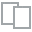
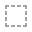
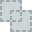
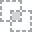
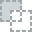
...
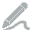
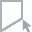
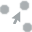
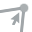
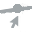

In [9]:

from dataprep.eda import create_report
create_report(data)

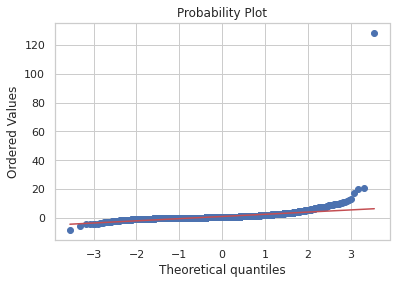

In [10]:
#let see y if normal distriputed or not
from scipy import stats
stats.probplot(data["Financial_Distress"], plot = plt);

In [11]:
#X Data
X = data.drop(['Financial_Distress'], axis=1, inplace=False)
print('X Data is \n' , X.head())
#print('X shape is ' , X.shape)

#y Data
y = data['Financial_Distress']
#print('y Data is \n' , y.head())
#print('y shape is ' , y.shape)

X Data is 
    Company  Time      x1        x2       x3       x4        x5        x6  \
0        1     1  1.2810  0.022934  0.87454  1.21640  0.060940  0.188270   
1        1     2  1.2700  0.006454  0.82067  1.00490 -0.014080  0.181040   
2        1     3  1.0529 -0.059379  0.92242  0.72926  0.020476  0.044865   
3        1     4  1.1131 -0.015229  0.85888  0.80974  0.076037  0.091033   
4        2     1  1.0623  0.107020  0.81460  0.83593  0.199960  0.047800   

        x7        x8  ...      x74    x75     x76     x77   x78  x79  x80  \
0  0.52510  0.018854  ...   85.437  27.07  26.102  16.000  16.0  0.2   22   
1  0.62288  0.006423  ...  107.090  31.31  30.194  17.000  16.0  0.4   22   
2  0.43292 -0.081423  ...  120.870  36.07  35.273  17.000  15.0 -0.2   22   
3  0.67546 -0.018807  ...   54.806  39.80  38.377  17.167  16.0  5.6   22   
4  0.74200  0.128030  ...   85.437  27.07  26.102  16.000  16.0  0.2   29   

        x81  x82  x83  
0  0.060390   30   49  
1  0.010636   31   5

In [12]:
for Y in range(0,len(y)): # Coverting the values into binary
       if y[Y] > -0.5:
              y[Y] = 0
       else:
              y[Y] = 1



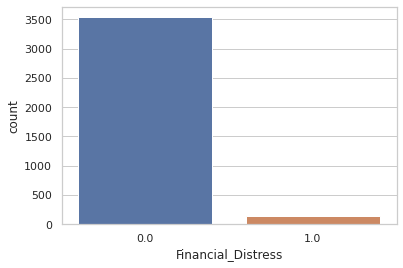

In [13]:
sns.countplot(x=y)

**WE Have Imbalnced Data**

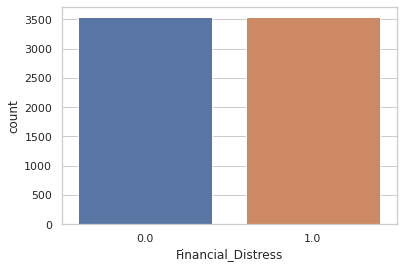

In [14]:
#Oversampling the Target vaiable using SMOTE
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X,y=oversample.fit_resample(X,y)
sns.countplot(x=y)

In [15]:
X[X < 0] = 0

In [16]:
#Import Libraries
from sklearn.impute import SimpleImputer
import numpy as np
#----------------------------------------------------

#----------------------------------------------------
# Cleaning data

'''
impute.SimpleImputer(missing_values=nan, strategy='mean’, fill_value=None, verbose=0, copy=True)
'''


ImputedModule = SimpleImputer(missing_values = np.nan, strategy ='mean')
ImputedX = ImputedModule.fit(X)
X = ImputedX.transform(X)


#X Data
print('X Data is \n' , X[:10])

#y Data
print('y Data is \n' , y[:10])

X Data is 
 [[1.0000e+00 1.0000e+00 1.2810e+00 2.2934e-02 8.7454e-01 1.2164e+00
  6.0940e-02 1.8827e-01 5.2510e-01 1.8854e-02 1.8279e-01 6.4489e-03
  8.5822e-01 2.0058e+00 1.2546e-01 6.9706e+00 4.6512e+00 5.0100e-02
  2.1984e+00 1.8265e-02 2.4978e-02 2.7264e-02 1.4173e+00 9.5554e+00
  1.4872e-01 6.6995e-01 2.1476e+02 1.2641e+01 6.4607e+00 4.3835e-02
  2.0459e-01 3.5179e-01 8.3161e+00 2.8922e-01 7.6606e-01 2.5825e+00
  7.7400e+01 2.6722e-02 1.6307e+00 1.5016e-02 5.4783e-03 1.2730e-01
  9.6951e+00 0.0000e+00 9.8559e-01 1.8016e-01 1.5006e+00 2.6224e-02
  7.0513e+00 1.1749e+03 5.3399e+00 8.5128e-01 1.2837e+01 6.1737e-02
  1.8090e-01 2.0987e+02 0.0000e+00 4.7101e-01 1.0990e-01 0.0000e+00
  0.0000e+00 2.2009e-01 7.1241e+00 1.5381e+01 3.2702e+00 1.7872e+01
  3.4692e+01 3.0087e+01 1.2800e+01 7.9914e+03 3.6495e+02 1.5800e+01
  6.1476e+01 4.0000e+00 3.6000e+01 8.5437e+01 2.7070e+01 2.6102e+01
  1.6000e+01 1.6000e+01 2.0000e-01 2.2000e+01 6.0390e-02 3.0000e+01
  4.9000e+01]
 [1.0000e+00 2.0000e+0

In [17]:
# y=y.astype('int')
# X=X.astype('int')



In [18]:
#Import Libraries
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import chi2 , f_classif 
#----------------------------------------------------

#----------------------------------------------------
#Feature Selection by Percentile
print('Original X Shape is ' , X.shape)
FeatureSelection = SelectPercentile(score_func = chi2, percentile=20) # score_func can = f_classif
X = FeatureSelection.fit_transform(X, y)

#showing X Dimension 
print('X Shape is ' , X.shape)
print('Selected Features are : ' , FeatureSelection.get_support())

Original X Shape is  (7072, 85)
X Shape is  (7072, 17)
Selected Features are :  [False False False False False False False False False  True False False
 False  True False False  True  True  True False  True False False False
 False False  True False False False False False  True  True False  True
  True False False False  True False False False False False False False
  True  True False False False  True False  True False False False False
 False False False False False False False False False  True False False
 False False False False False False False False False False False False
 False]


In [19]:
#Import Libraries
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
#----------------------------------------------------

#----------------------------------------------------
#Standard Scaler for Data

scaler = StandardScaler(copy=True, with_mean=True, with_std=True)
X = scaler.fit_transform(X)

#showing data
#print('X \n' , X[:10])
#print('y \n' , y[:10])

#----------------------------------------------------
#Splitting data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=44, shuffle =True)

#Splitted Data
#print('X_train shape is ' , X_train.shape)
#print('X_test shape is ' , X_test.shape)
#print('y_train shape is ' , y_train.shape)
#print('y_test shape is ' , y_test.shape)

{'KNN': 0.8898886032562126, 'Logistic Regression': 0.799057412167952, 'Random Forest': 0.9687232219365896, 'DecisionTree': 0.9318766066838047, 'SVC': 0.8153384747215081, 'GaussianNB': 0.6062553556126821, 'GradientBoosting': 0.9455869751499572}


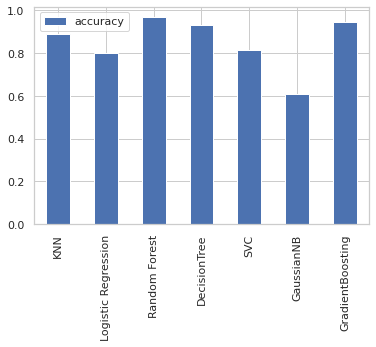

In [20]:
#Import Libraries
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
# Put models in a dictionary
models = {"KNN": KNeighborsClassifier(),
          "Logistic Regression": LogisticRegression(), 
          "Random Forest": RandomForestClassifier(),
          "DecisionTree" :  DecisionTreeClassifier(),
          "SVC"          : SVC(),
          "GaussianNB"   : GaussianNB(),
          "GradientBoosting": GradientBoostingClassifier()}

# Create function to fit and score models
def fit_and_score(models, X_train, X_test, y_train, y_test):
    """
    Fits and evaluates given machine learning models.
    models : a dict of different Scikit-Learn machine learning models
    X_train : training data
    X_test : testing data
    y_train : labels assosciated with training data
    y_test : labels assosciated with test data
    """
    # Random seed for reproducible results
    np.random.seed(44)
    # Make a list to keep model scores
    model_scores = {}
    # Loop through models
    for name, model in models.items():
        # Fit the model to the data
        model.fit(X_train, y_train)
        # Evaluate the model and append its score to model_scores
        model_scores[name] = model.score(X_test, y_test)
    return model_scores

model_scores = fit_and_score(models=models,
                             X_train=X_train,
                             X_test=X_test,
                             y_train=y_train,
                             y_test=y_test)
print(np.array(model_scores))

#Model Comparison
model_compare = pd.DataFrame(model_scores, index=['accuracy'])
model_compare.T.plot.bar();

In [21]:
#Import Libraries
from sklearn.ensemble import RandomForestClassifier
#----------------------------------------------------

#----------------------------------------------------
#Applying RandomForestClassifier Model 

'''
ensemble.RandomForestClassifier(n_estimators='warn’, criterion=’gini’, max_depth=None,
                                min_samples_split=2, min_samples_leaf=1,min_weight_fraction_leaf=0.0,
                                max_features='auto’,max_leaf_nodes=None,min_impurity_decrease=0.0,
                                min_impurity_split=None, bootstrap=True,oob_score=False, n_jobs=None,
                                random_state=None, verbose=0,warm_start=False, class_weight=None)
'''

RandomForestClassifierModel = RandomForestClassifier(criterion = 'gini',n_estimators=100,max_depth=2,random_state=33) #criterion can be also : entropy 
RandomForestClassifierModel.fit(X_train, y_train)

#Calculating Details
print('RandomForestClassifierModel Train Score is : ' , RandomForestClassifierModel.score(X_train, y_train))
print('RandomForestClassifierModel Test Score is : ' , RandomForestClassifierModel.score(X_test, y_test))
print('RandomForestClassifierModel features importances are : ' , RandomForestClassifierModel.feature_importances_)
#print('----------------------------------------------------')

#Calculating Prediction
y_pred = RandomForestClassifierModel.predict(X_test)
y_pred_prob = RandomForestClassifierModel.predict_proba(X_test)
#print('Predicted Value for RandomForestClassifierModel is : ' , y_pred[:10])
#print('Prediction Probabilities Value for RandomForestClassifierModel is : ' , y_pred_prob[:10])

RandomForestClassifierModel Train Score is :  0.8784297171802449
RandomForestClassifierModel Test Score is :  0.8821765209940017
RandomForestClassifierModel features importances are :  [0.21274718 0.05992109 0.         0.16261402 0.00177885 0.01703123
 0.17603869 0.         0.00223097 0.00487014 0.00388189 0.00142664
 0.18045788 0.0544355  0.11087443 0.01119398 0.0004975 ]


In [27]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = np.arange(2, 50, 2)
# Minimum number of samples required at each leaf node
min_samples_leaf = np.arange(1, 20, 2)

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations

tuning_model= RandomizedSearchCV(estimator = RandomForestClassifierModel , param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=33, n_jobs = 1)
tuning_model.fit(X_train, y_train)
print(tuning_model.best_params_)
print(tuning_model.best_score_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=25, max_features=auto, min_samples_leaf=3, min_samples_split=42, n_estimators=500; total time=   7.7s
[CV] END max_depth=25, max_features=auto, min_samples_leaf=3, min_samples_split=42, n_estimators=500; total time=   5.1s
[CV] END max_depth=25, max_features=auto, min_samples_leaf=3, min_samples_split=42, n_estimators=500; total time=   4.8s
[CV] END max_depth=25, max_features=auto, min_samples_leaf=3, min_samples_split=42, n_estimators=500; total time=   4.8s
[CV] END max_depth=25, max_features=auto, min_samples_leaf=3, min_samples_split=42, n_estimators=500; total time=   4.8s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=17, min_samples_split=24, n_estimators=400; total time=   2.6s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=17, min_samples_split=24, n_estimators=400; total time=   2.6s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=17, min_samples_split=24, n_estima

In [ ]:
####{'n_estimators': 400, 'min_samples_split': 34, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'max_depth': 25}


In [30]:
#Import Libraries
from sklearn.ensemble import RandomForestClassifier
#----------------------------------------------------

#----------------------------------------------------
#Applying RandomForestClassifier Model 

'''
ensemble.RandomForestClassifier(n_estimators='warn’, criterion=’gini’, max_depth=None,
                                min_samples_split=2, min_samples_leaf=1,min_weight_fraction_leaf=0.0,
                                max_features='auto’,max_leaf_nodes=None,min_impurity_decrease=0.0,
                                min_impurity_split=None, bootstrap=True,oob_score=False, n_jobs=None,
                                random_state=None, verbose=0,warm_start=False, class_weight=None)
'''

RandomForestClassifierModel = RandomForestClassifier(criterion = 'gini',n_estimators=400,max_depth=25,random_state=33,min_samples_split=34,max_features='sqrt') #criterion can be also : entropy 
RandomForestClassifierModel.fit(X_train, y_train)

#Calculating Details
print('RandomForestClassifierModel Train Score is : ' , RandomForestClassifierModel.score(X_train, y_train))
print('RandomForestClassifierModel Test Score is : ' , RandomForestClassifierModel.score(X_test, y_test))
print('RandomForestClassifierModel features importances are : ' , RandomForestClassifierModel.feature_importances_)
#print('----------------------------------------------------')

#Calculating Prediction
y_pred = RandomForestClassifierModel.predict(X_test)
y_pred_prob = RandomForestClassifierModel.predict_proba(X_test)
#print('Predicted Value for RandomForestClassifierModel is : ' , y_pred[:10])
#print('Prediction Probabilities Value for RandomForestClassifierModel is : ' , y_pred_prob[:10])

RandomForestClassifierModel Train Score is :  0.9702406078514141
RandomForestClassifierModel Test Score is :  0.9528706083976007
RandomForestClassifierModel features importances are :  [0.17034775 0.03450944 0.01365913 0.11093061 0.01781345 0.02364832
 0.1468073  0.00645087 0.02555648 0.01925006 0.02118456 0.00934635
 0.21169417 0.05693823 0.08531737 0.02381314 0.02273278]


In [31]:
# Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.93      0.95      1155
         1.0       0.93      0.98      0.95      1179

    accuracy                           0.95      2334
   macro avg       0.95      0.95      0.95      2334
weighted avg       0.95      0.95      0.95      2334



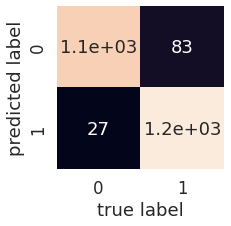

In [32]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
sns.set(font_scale=1.5) # Increase font size

def plot_conf_mat(y_test, y_preds):
    """
    Plots a confusion matrix using Seaborn's heatmap().
    """
    fig, ax = plt.subplots(figsize=(3, 3))
    ax = sns.heatmap(confusion_matrix(y_test, y_pred),
                     annot=True, # Annotate the boxes
                     cbar=False)
    plt.xlabel("true label")
    plt.ylabel("predicted label")
    
plot_conf_mat(y_test, y_pred)

In [35]:
#Import Libraries
from sklearn.model_selection import cross_val_score
#----------------------------------------------------

#----------------------------------------------------
#Applying Cross Validate Score :  
'''
model_selection.cross_val_score(estimator,X,y=None,groups=None,scoring=None,cv=’warn’,n_jobs=None,verbose=0,
                                fit_params=None,pre_dispatch=‘2*n_jobs’,error_score=’raise-deprecating’)
'''

#  don't forget to define the model first !!!
CrossValidateScoreTrain = cross_val_score(RandomForestClassifierModel, X_train, y_train, cv=3)
CrossValidateScoreTest = cross_val_score(RandomForestClassifierModel, X_test, y_test, cv=3)

# Showing Results
print('Cross Validate Score for Training Set: \n', CrossValidateScoreTrain.mean())
print('Cross Validate Score for Testing Set: \n', CrossValidateScoreTest.mean())

Cross Validate Score for Training Set: 
 0.9364695649385527
Cross Validate Score for Testing Set: 
 0.9215938303341903


In [36]:
#Import Libraries
from sklearn.model_selection import cross_val_predict
#----------------------------------------------------

#----------------------------------------------------
#Applying Cross Validate Predict :  
'''
model_selection.cross_val_predict(estimator, X, y=None, groups=None,cv=’warn’, n_jobs=None,verbose=0,
                                  fit_params=None, pre_dispatch=‘2*n_jobs’,method=’predict’)
'''

#  don't forget to define the model first !!!
CrossValidatePredictionTrain = cross_val_predict(RandomForestClassifierModel, X_train, y_train, cv=3)
CrossValidatePredictionTest = cross_val_predict(RandomForestClassifierModel, X_test, y_test, cv=3)

# Showing Results
print('Cross Validate Prediction for Training Set: \n', CrossValidatePredictionTrain[:10])
print('Cross Validate Prediction for Testing Set: \n', CrossValidatePredictionTest[:10])

Cross Validate Prediction for Training Set: 
 [0. 0. 1. 0. 0. 1. 1. 1. 1. 0.]
Cross Validate Prediction for Testing Set: 
 [0. 1. 0. 1. 0. 1. 0. 0. 0. 1.]
